In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image

def showFlowLK(filename, frames_n, points=100, frame_diff=12, channel=None):
    
    cap = cv2.VideoCapture(filename)
    counter = 0
    while(1):
        if counter == frames_n - frame_diff:
            ret, frame1 = cap.read()
        ret, frame2 = cap.read()
        if counter > frames_n:
            break
        counter += 1
            
    X = np.linspace(0, frame1.shape[1]-1, points)
    Y = np.linspace(0, frame1.shape[0]-1, points)
    XX, YY = np.meshgrid(X, Y)
    p0 = np.c_[XX.ravel(), YY.ravel()].reshape(points**2, 1, 2).astype("float32")
    
    mask = np.zeros_like(frame1)

    if not channel:
        frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
        frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    else:
        frame1_gray = frame1[:, :, channel]
        frame2_gray = frame2[:, :, channel]
    p1, st, err = cv2.calcOpticalFlowPyrLK(frame1_gray, frame2_gray, p0, None, **lk_params)
    
    good_new = p1[st==1]
    good_old = p0[st==1]
    for point in p0:
        frame1 = cv2.circle(frame1,(int(point[0][0]),int(point[0][1])),3, (255, 0, 0),-1)
    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(c),int(d)), (int(a),int(b)), (0, 255, 0), 2)
    img = cv2.add(frame1, mask)
    fig = plt.figure(figsize=(16, 9), dpi=150)
    plt.imshow(img)
    plt.show()



---
# Lucas-Kanade method - Shi-Tomasi

In [2]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
POINTS_N = 20

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(POINTS_N**2,3))

ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

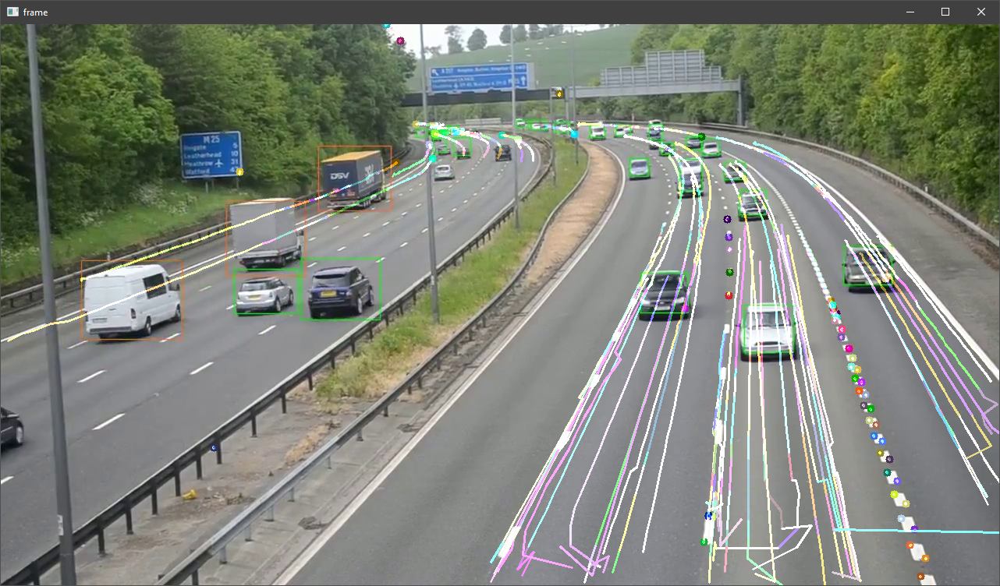

In [3]:
Image(data='3_1.png')

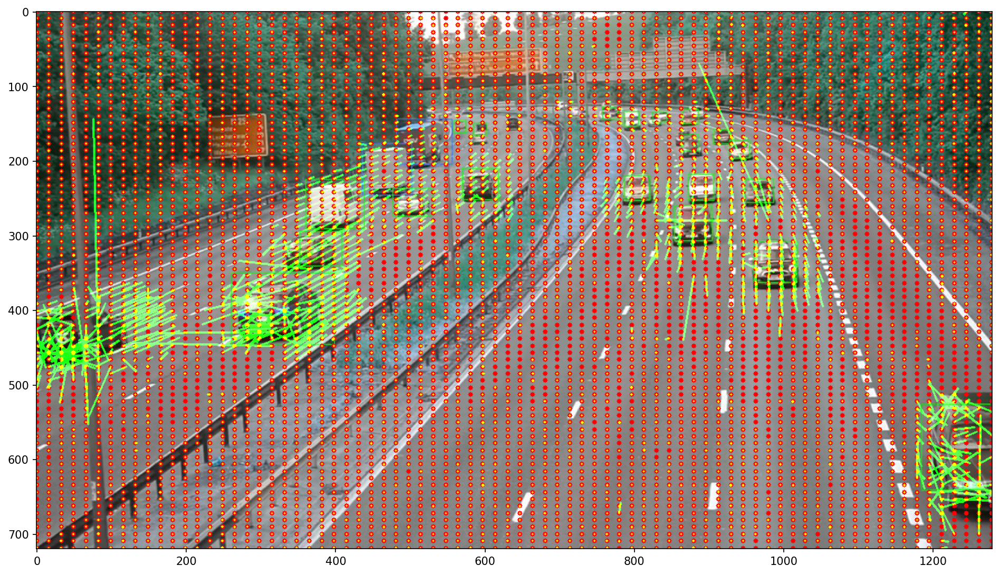

In [4]:
showFlowLK("GoodVision Traffic Counting using Camera Video Analytics _1.mp4", 176, points=78, frame_diff=1)

---
# Gunner Farneback

In [5]:
cap = cv2.VideoCapture("GoodVision Traffic Counting using Camera Video Analytics _1.mp4")

ret, frame1 = cap.read()
prvs = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
hsv = np.zeros_like(frame1)
hsv[...,1] = 255

while(1):
    ret, frame2 = cap.read()
    next = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)

    flow = cv2.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)

    cv2.imshow('frame2',rgb)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
    elif k == ord('s'):
        cv2.imwrite('opticalfb.png',frame2)
        cv2.imwrite('opticalhsv.png',rgb)
    prvs = next

cap.release()
cv2.destroyAllWindows()

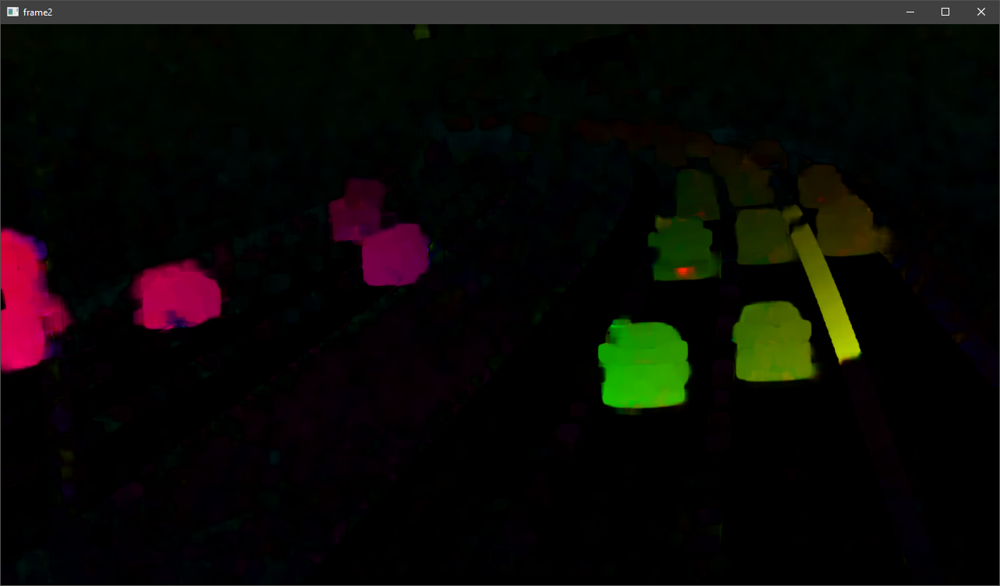

In [6]:
Image(data="3_2.png")

---
# Lukas-Kanade / Gunner Farneback - RGB Channels
# Red

In [7]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
POINTS_N = 20

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(POINTS_N**2,3))

ret, old_frame = cap.read()
old_gray = old_frame[:, :, 2]
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = frame[:, :, 2]
    
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
        
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

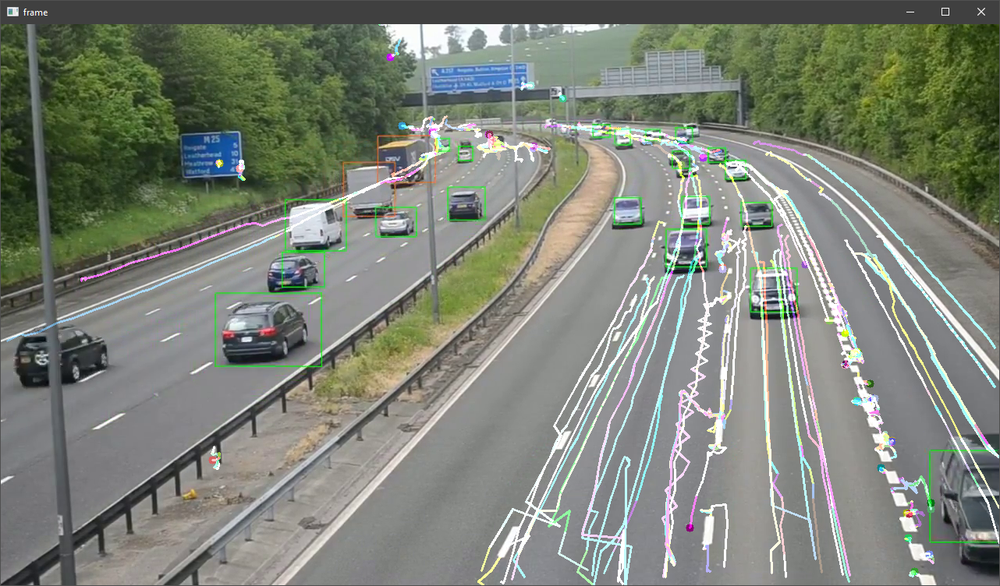

In [8]:
Image(data="3_3_R_LK.png")

In [9]:
cap = cv2.VideoCapture("GoodVision Traffic Counting using Camera Video Analytics _1.mp4")

ret, frame1 = cap.read()
prvs = frame1[:, :, 2]
hsv = np.zeros_like(frame1)
hsv[...,1] = 255

while(1):
    ret, frame2 = cap.read()
    next = frame2[:, :, 2]

    flow = cv2.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)

    cv2.imshow('frame2',rgb)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
    elif k == ord('s'):
        cv2.imwrite('opticalfb.png',frame2)
        cv2.imwrite('opticalhsv.png',rgb)
    prvs = next

cap.release()
cv2.destroyAllWindows()

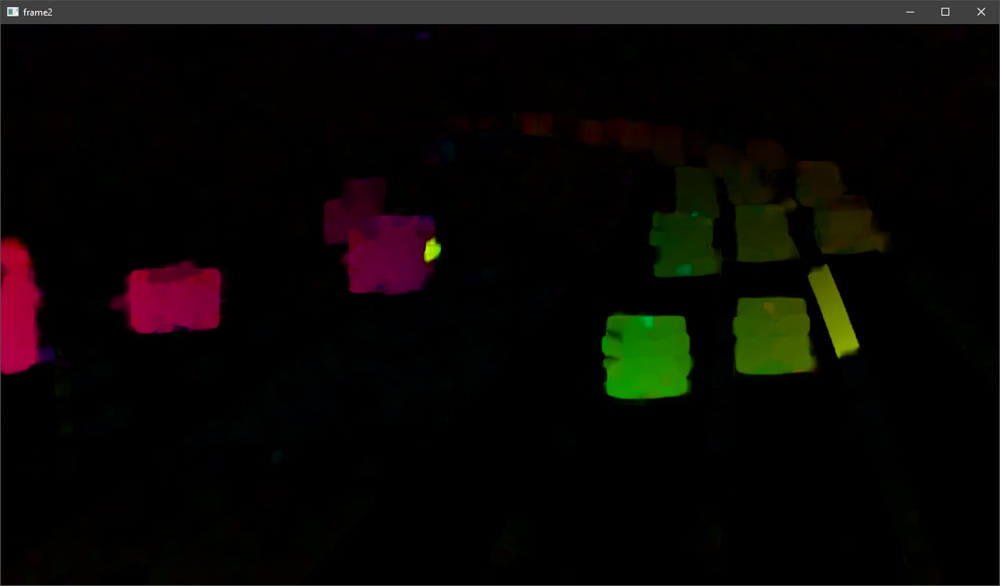

In [10]:
Image(data="3_3_R_GF.png")

# Green

In [11]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
POINTS_N = 20

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(POINTS_N**2,3))

ret, old_frame = cap.read()
old_gray = old_frame[:, :, 1]
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = frame[:, :, 1]
    
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
        
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

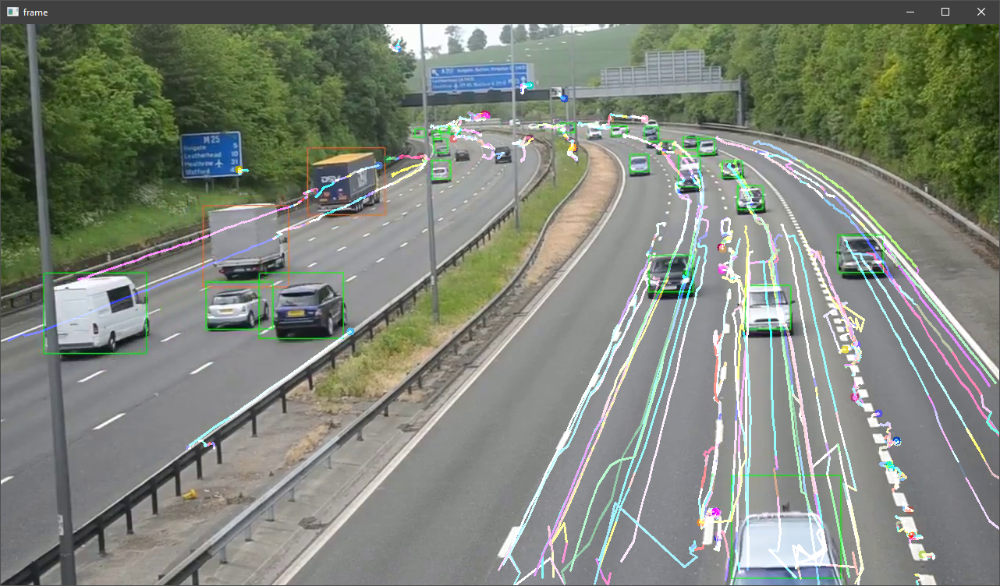

In [12]:
Image(data="3_3_G_LK.png")

In [13]:
cap = cv2.VideoCapture("GoodVision Traffic Counting using Camera Video Analytics _1.mp4")

ret, frame1 = cap.read()
prvs = frame1[:, :, 1]
hsv = np.zeros_like(frame1)
hsv[...,1] = 255

while(1):
    ret, frame2 = cap.read()
    next = frame2[:, :, 1]

    flow = cv2.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)

    cv2.imshow('frame2',rgb)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
    elif k == ord('s'):
        cv2.imwrite('opticalfb.png',frame2)
        cv2.imwrite('opticalhsv.png',rgb)
    prvs = next

cap.release()
cv2.destroyAllWindows()

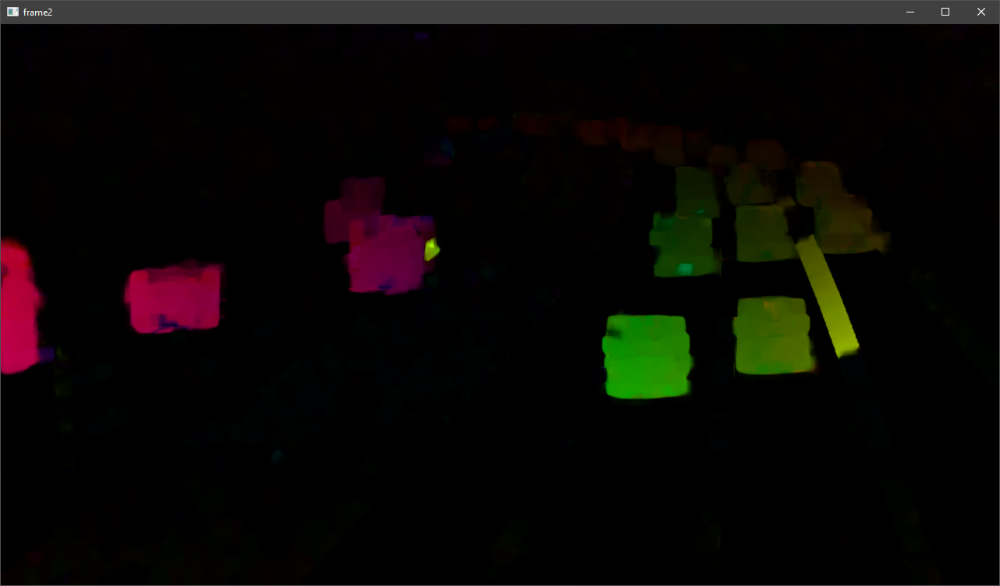

In [14]:
Image(data="3_3_G_GF.png")

# Blue

In [15]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
POINTS_N = 20

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(POINTS_N**2,3))

ret, old_frame = cap.read()
old_gray = old_frame[:, :, 0]
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = frame[:, :, 0]
    
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
        
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

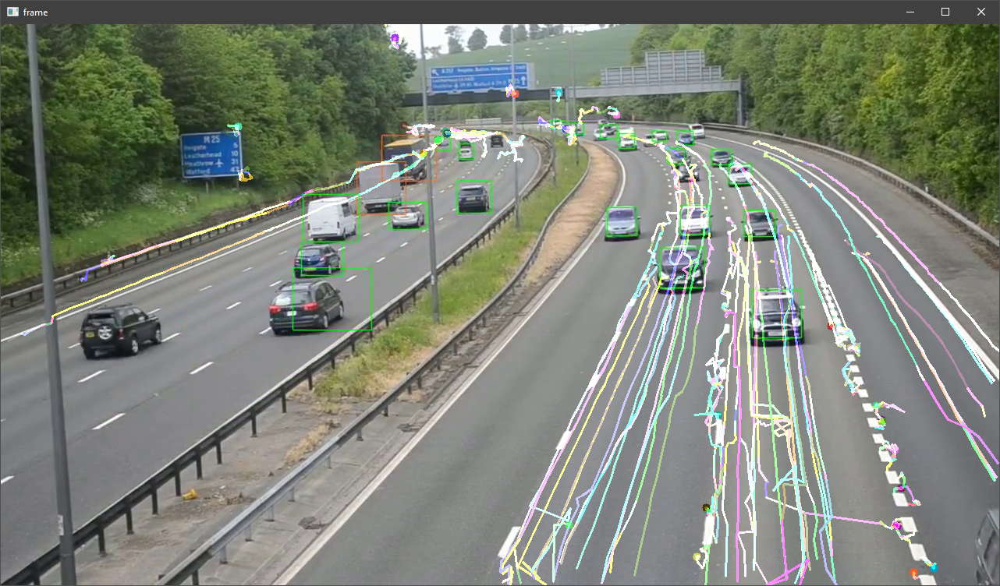

In [16]:
Image(data="3_3_B_LK.png")

In [17]:
cap = cv2.VideoCapture("GoodVision Traffic Counting using Camera Video Analytics _1.mp4")

ret, frame1 = cap.read()
prvs = frame1[:, :, 1]
hsv = np.zeros_like(frame1)
hsv[...,1] = 255

while(1):
    ret, frame2 = cap.read()
    next = frame2[:, :, 1]

    flow = cv2.calcOpticalFlowFarneback(prvs,next, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv2.normalize(mag,None,0,255,cv2.NORM_MINMAX)
    rgb = cv2.cvtColor(hsv,cv2.COLOR_HSV2BGR)

    cv2.imshow('frame2',rgb)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break
    elif k == ord('s'):
        cv2.imwrite('opticalfb.png',frame2)
        cv2.imwrite('opticalhsv.png',rgb)
    prvs = next

cap.release()
cv2.destroyAllWindows()

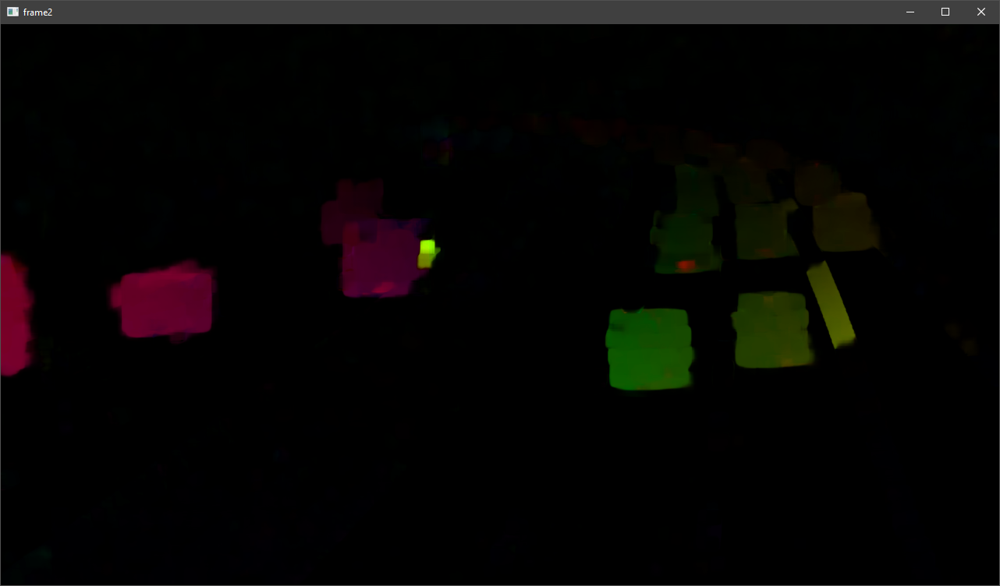

In [18]:
Image(data="3_3_B_GF.png")

---
# 100 points

In [19]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
points = 100

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(points**2,3))

ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

X = np.random.randint(0, frame1.shape[1]-1, points)
Y = np.random.randint(0, frame1.shape[0]-1, points)
p0 = np.c_[X.ravel(), Y.ravel()].reshape(points, 1, 2).astype("float32")

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

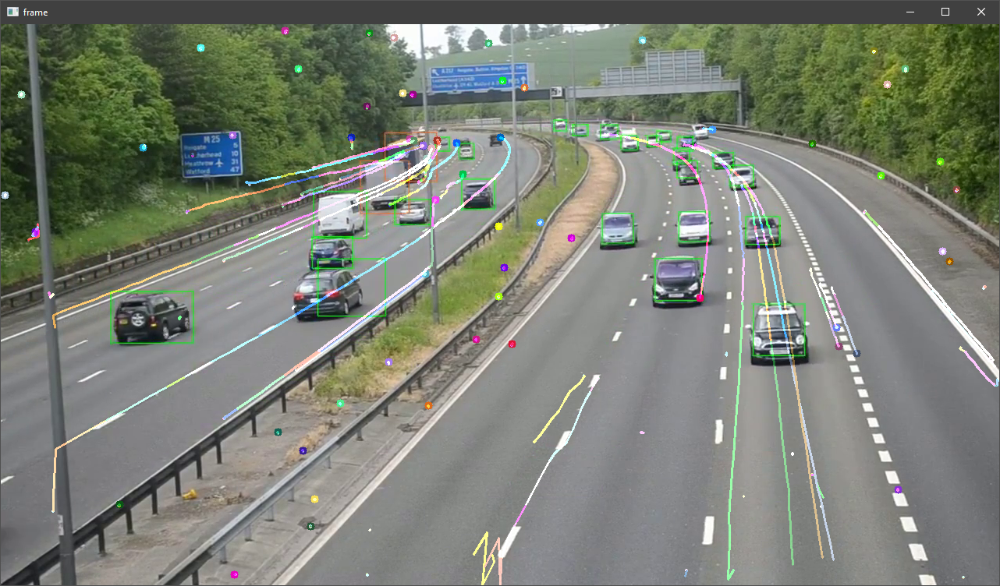

In [20]:
Image(data="3_4_100.png")

# 400 points

In [21]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
points = 400

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(points**2,3))

ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

X = np.random.randint(0, frame1.shape[1]-1, points)
Y = np.random.randint(0, frame1.shape[0]-1, points)
p0 = np.c_[X.ravel(), Y.ravel()].reshape(points, 1, 2).astype("float32")

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

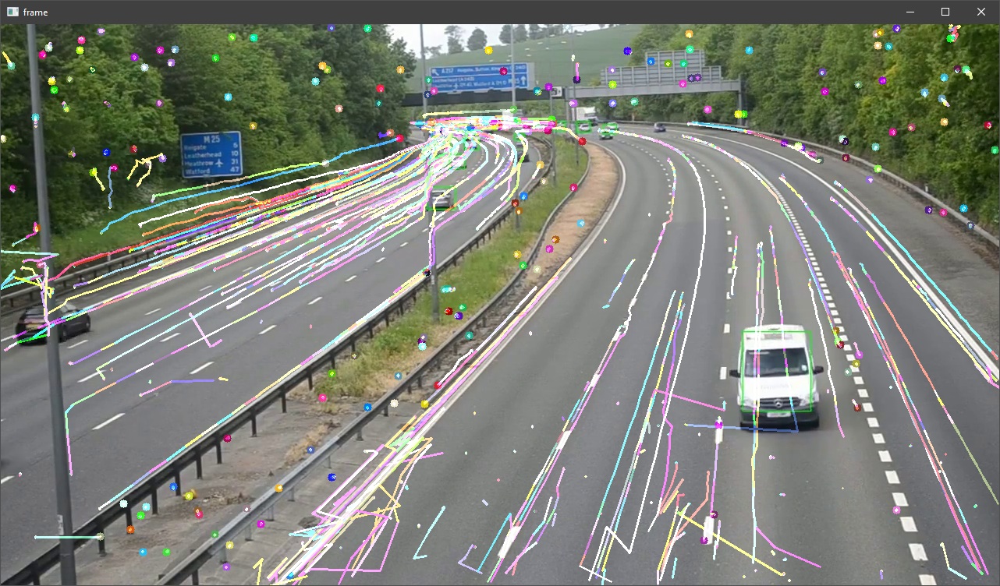

In [22]:
Image(data="3_4_400.png")

---

# 100 points

In [25]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
points = 10

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(points**2,3))

ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

X = np.linspace(0, frame1.shape[1]-1, points)
Y = np.linspace(0, frame1.shape[0]-1, points)
XX, YY = np.meshgrid(X, Y)
p0 = np.c_[XX.ravel(), YY.ravel()].reshape(points**2, 1, 2).astype("float32")

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

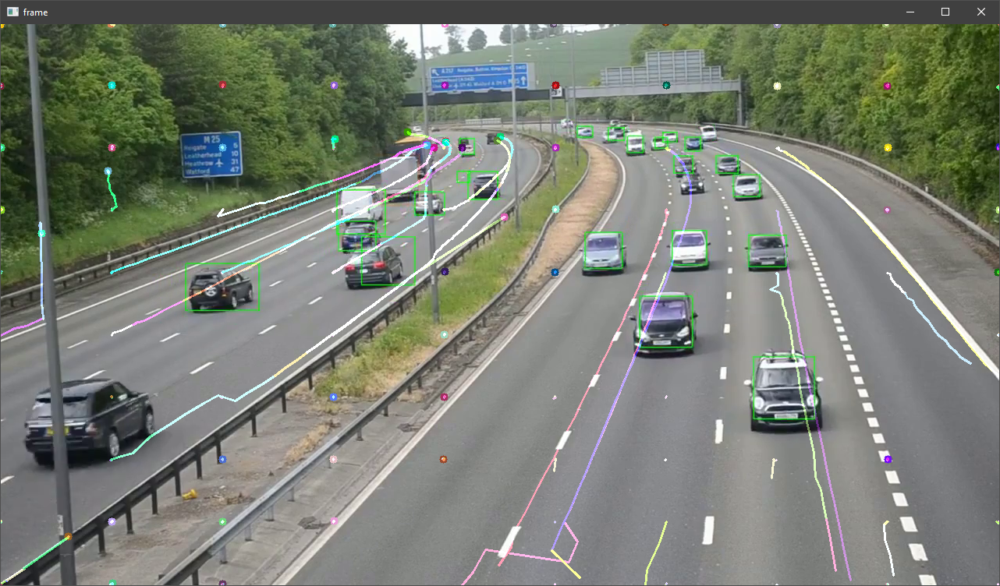

In [26]:
Image(data="3_5_100.png")

# 400 points

In [27]:
cap = cv2.VideoCapture('GoodVision Traffic Counting using Camera Video Analytics _1.mp4')
points = 20

feature_params = dict( maxCorners = 100,
                       qualityLevel = 0.3,
                       minDistance = 7,
                       blockSize = 7 )

lk_params = dict( winSize  = (15,15),
                  maxLevel = 2,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

color = np.random.randint(0,255,(points**2,3))

ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

X = np.linspace(0, frame1.shape[1]-1, points)
Y = np.linspace(0, frame1.shape[0]-1, points)
XX, YY = np.meshgrid(X, Y)
p0 = np.c_[XX.ravel(), YY.ravel()].reshape(points**2, 1, 2).astype("float32")

mask = np.zeros_like(old_frame)

while(1):
    ret,frame = cap.read()
    if not ret: break
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    for i,(new,old) in enumerate(zip(good_new,good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame,(int(a),int(b)),5,color[i].tolist(),-1)
    img = cv2.add(frame,mask)

    cv2.imshow('frame',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1,1,2)

cv2.destroyAllWindows()
cap.release()

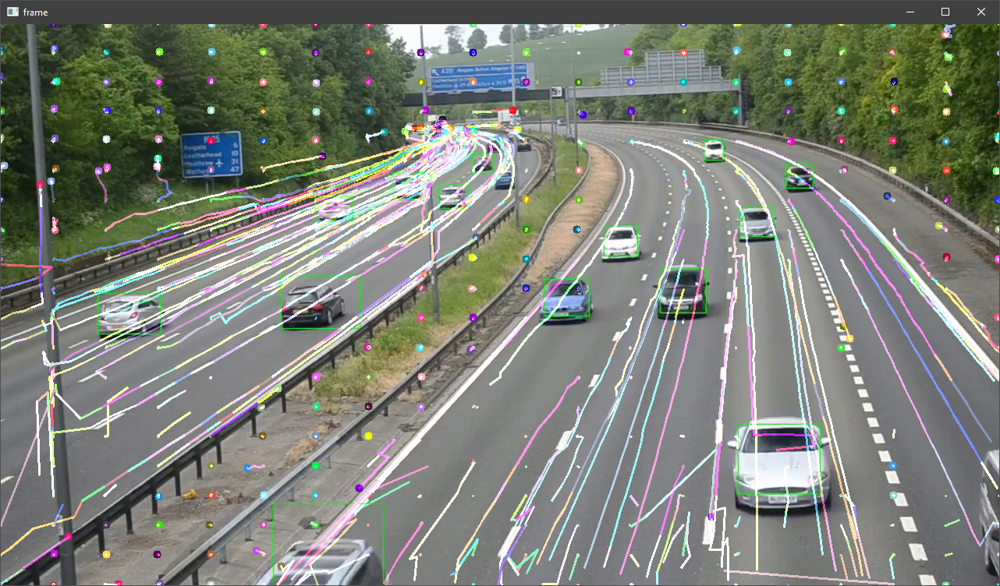

In [28]:
Image(data="3_5_400.png")